In [750]:
%matplotlib inline
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt

In [751]:
leituras_bvsa = pd.read_csv('./leituras_bvsa.csv')

In [752]:
#https://www.youtube.com/watch?v=MEEVcpnfElY
leituras_dique6c = pd.read_csv('./leituras_dique6c.csv')

In [753]:
loc_bvsa = pd.read_csv('./loc_bvsa.csv', sep=';', decimal=',')

In [754]:
loc_dique6c = pd.read_csv('./loc_dique6c.csv', sep=';', decimal=',')

In [755]:
loc_sensores = pd.read_excel('./LOCALIZAÇÃO_SENSORES.xlsx', engine='openpyxl', header=2)

In [756]:
leituras_bvsa['area'] = 'BVSA'
leituras_bvsa['area'] = 'Dique 6C'

In [757]:
leituras = pd.concat([leituras_bvsa, leituras_dique6c])
leituras = leituras.rename(columns={"Sensor":"sensor", "Data":"data", "Valor":"valor", "Unidade":"unidade", "Direcao_Saida":"direcao_saida", "Estado":"estado"})
leituras['direcao_saida'] = leituras['direcao_saida'].replace('Cota NA', 'Cota do NA')

In [758]:
leituras[leituras['direcao_saida'] == 'Cota do NA']['valor'].mean()

88.14659755901718

In [759]:
leituras['direcao_saida'].value_counts()

direcao_saida
Cota Piezométrica                             19204
Carga Piezométrica                            19204
Vazão                                         10554
Cota do NA                                     6227
Recalque (Z)                                   1007
Deslocamento Longitudinal (X)                  1007
Deslocamento Transversal (Y)                   1007
Recalque                                        819
Deslocamento da Estaca Dir(-)/Esq(+)            819
Deslocamento do Afastamento Mont(-)/Jus(+)      819
Leitura                                          32
Name: count, dtype: int64

In [760]:
leituras['sensor'] = leituras['sensor'].apply(lambda x: x.replace("‐", '-').strip())

In [761]:
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()

#leituras['id_sensor'] = le.fit_transform(leituras['sensor'])
leituras['id_unidade'] = le.fit_transform(leituras['unidade']) +1
leituras['id_direcao_saida'] = le.fit_transform(leituras['direcao_saida']) +1
leituras['id_estado'] = le.fit_transform(leituras['estado']) +1
leituras['id_area'] = le.fit_transform(leituras['area']) + 1

leituras = leituras.reset_index(drop=True)

In [762]:
#Criação da tabela de sensores

In [763]:
pd.concat([leituras_bvsa[['Sensor']], leituras_dique6c[['Sensor']], loc_bvsa[['Sensor']], loc_dique6c[['Sensor']]])

,Sensor
0,PZ-BM-BV-54
1,PZ-BM-BV-54
2,PZ-BM-BV-53
3,PZ-BM-BV-53
4,PZ-BM-BV-53
...,...
56,MV‐D06C‐04
57,RM‐D06C‐01
58,RM‐D06C‐02
59,RM‐D06C‐03


In [764]:
aux = pd.concat([leituras_bvsa[['Sensor']], leituras_dique6c[['Sensor']], loc_bvsa[['Sensor']], loc_dique6c[['Sensor']]])
tabela_sensores = aux.drop_duplicates().sort_values(by=['Sensor']).reset_index(drop=True)
tabela_sensores.index = tabela_sensores.index+1
dict_sensores = tabela_sensores.reset_index()[['Sensor','index']].to_dict(orient = 'tight')
dict_sensores = dict(dict_sensores['data']);

In [765]:
leituras['id_sensor'] = leituras['sensor'].map(dict_sensores) +1

In [766]:
leituras = leituras[['id_sensor','id_unidade', 'id_direcao_saida', 'id_estado', 'id_area', 'sensor', 'data', 'valor', 'unidade', 'direcao_saida', 'estado', 'area']]

In [767]:
sensores = pd.DataFrame(tabela_sensores)
sensores = sensores.rename(columns={"Sensor":"name"})
sensores

,name
1,IN‐BM‐BV‐11
2,IN‐BM‐BV‐12
3,MNA-AEF1-01
4,MNA-AEF1-02
5,MNA-BM-BV-51
...,...
301,RN‐BM‐BV‐04
302,RN‐D06C‐01
303,RN‐D06C‐02
304,RN‐D06C‐03


In [768]:
#Criação da Tabela de Unidade

In [769]:
tabela_unidades = pd.concat([leituras_bvsa['Unidade'], leituras_dique6c['Unidade']])
tabela_unidades = tabela_unidades.drop_duplicates().sort_values().reset_index(drop=True)
unidades = pd.DataFrame(tabela_unidades)
unidades = unidades.rename(columns={"Unidade":"name"})
unidades

,name
0,l/min
1,l/s
2,m
3,m.c.a
4,m3/min
5,m3/s
6,seg


In [770]:
#Tabela de Direcao Saida

In [771]:
tabela_direcao_saida = pd.concat([leituras_bvsa['Direcao_Saida'], leituras_dique6c['Direcao_Saida']])
tabela_direcao_saida = tabela_direcao_saida.drop_duplicates().sort_values().reset_index(drop=True)
direcao_saida = pd.DataFrame(tabela_direcao_saida)
direcao_saida = direcao_saida.rename(columns={"Direcao_Saida":"name"})
direcao_saida

,name
0,Carga Piezométrica
1,Cota NA
2,Cota Piezométrica
3,Cota do NA
4,Deslocamento Longitudinal (X)
5,Deslocamento Transversal (Y)
6,Deslocamento da Estaca Dir(-)/Esq(+)
7,Deslocamento do Afastamento Mont(-)/Jus(+)
8,Leitura
9,Recalque


In [772]:
# Tabela de Estado
leituras['estado'].value_counts()

estado
normal     60289
atencao      320
alerta        90
Name: count, dtype: int64

In [773]:
# Leituras duplicadas
#leituras[leituras.duplicated(keep=False)]
leituras = leituras.drop_duplicates()

In [774]:
#Tratamento dos dados de localização
import geopandas as gpd

In [775]:
localizacao = gpd.GeoDataFrame(pd.concat([loc_bvsa, loc_dique6c]))
localizacao = localizacao.rename(columns={"Sensor":"sensor", "Latitude":"latitude", "Longitude":"longitude", "Altura":"altura"})

In [776]:
localizacao['sensor'] = localizacao['sensor'].apply(lambda x: x.replace("‐", '-').strip())

In [777]:
localizacao['id_sensor'] = localizacao['sensor'].map(dict_sensores)

In [778]:
localizacao

,sensor,N,E,latitude,longitude,altura,id_sensor
0,PZ-BM-BV-11,9.652626e+09,412507056.0,-3.142831,-51.787880,74.48,181.0
1,PZ-BM-BV-12,9.652626e+09,412507056.0,-3.142831,-51.787880,59.15,182.0
2,PZ-BM-BV-13,9.652636e+09,412475409.0,-3.142733,-51.788165,69.96,183.0
3,PZ-BM-BV-14,9.652636e+09,412475409.0,-3.142733,-51.788165,54.44,184.0
4,PZ-BM-BV-15,9.652622e+09,412336622.0,-3.142866,-51.789414,65.00,185.0
...,...,...,...,...,...,...,...
56,MV-D06C-04,9.652152e+09,413817837.0,-3.147122,-51.776087,65.00,137.0
57,RM-D06C-01,9.651928e+09,413655231.0,-3.149147,-51.777552,100.00,NaN
58,RM-D06C-02,9.651928e+09,413655231.0,-3.149147,-51.777552,100.00,NaN
59,RM-D06C-03,9.651928e+09,413655231.0,-3.149147,-51.777552,100.00,NaN


In [779]:
x_latitude = localizacao['latitude']
y_longitude = localizacao['longitude']
z_altura = localizacao['altura']

In [780]:
localizacao['geom'] = gpd.GeoSeries.from_xy(x =x_latitude, y=y_longitude, z=z_altura)

In [781]:
localizacao = localizacao[['id_sensor', 'sensor', 'latitude', 'longitude', 'altura', 'geom']]

In [782]:
localizacao.head()

,id_sensor,sensor,latitude,longitude,altura,geom
0,181.0,PZ-BM-BV-11,-3.142831,-51.787880,74.48,POINT Z (-3.14283 -51.78788 74.48000)
1,182.0,PZ-BM-BV-12,-3.142831,-51.787880,59.15,POINT Z (-3.14283 -51.78788 59.15000)
2,183.0,PZ-BM-BV-13,-3.142733,-51.788165,69.96,POINT Z (-3.14273 -51.78816 69.96000)
3,184.0,PZ-BM-BV-14,-3.142733,-51.788165,54.44,POINT Z (-3.14273 -51.78816 54.44000)
4,185.0,PZ-BM-BV-15,-3.142866,-51.789414,65.00,POINT Z (-3.14287 -51.78941 65.00000)


In [783]:
import sqlite3
con = sqlite3.connect("database.db")

In [784]:
cur = con.cursor()

In [785]:
cur.execute("CREATE TABLE if not exists sensores(id INTEGER PRIMARY KEY AUTOINCREMENT, name text)");
cur.execute("CREATE TABLE if not exists unidades(id INTEGER PRIMARY KEY AUTOINCREMENT, name text)");
cur.execute("CREATE TABLE if not exists direcao_saida(id INTEGER PRIMARY KEY AUTOINCREMENT, name text)");
cur.execute("CREATE TABLE if not exists localizacao(id_sensor integer, sensor text, latitude float, longitude float, altura float, geom)");
cur.execute("CREATE TABLE if not exists leituras(id_sensor integer, id_unidade integer, id_direcao_saida integer, id_estado integer, id_area integer, sensor text, data date, valor float, unidade text, direcao_saida text, estado text, area text)");

In [786]:
localizacao_ = localizacao[['id_sensor', 'sensor', 'latitude', 'longitude', 'altura']]

In [787]:
sensores.to_sql('sensores', con=con, if_exists='replace', index=False)
unidades.to_sql('unidades', con=con, if_exists='replace', index=False)
direcao_saida.to_sql('direcao_saida', con=con, if_exists='replace', index=False)
localizacao_.to_sql('localizacao', con=con, if_exists='replace', index=False)
leituras.to_sql('leituras', con=con, if_exists='replace', index=False)

60670

In [788]:
# Não há dados de localização dos densores da tabela de leituras
a = leituras['sensor'].drop_duplicates().to_list() + localizacao['sensor'].drop_duplicates().to_list()
pd.DataFrame(a).value_counts();

In [789]:
from ydata_profiling import ProfileReport

In [790]:
leituras[['unidade', 'direcao_saida']].value_counts()

unidade  direcao_saida                             
m        Cota Piezométrica                             19200
m.c.a    Carga Piezométrica                            19200
m        Cota do NA                                     6206
l/min    Vazão                                          3518
l/s      Vazão                                          3518
m3/s     Vazão                                          3486
m        Deslocamento Longitudinal (X)                  1007
         Deslocamento Transversal (Y)                   1007
         Recalque (Z)                                   1007
         Deslocamento da Estaca Dir(-)/Esq(+)            819
         Deslocamento do Afastamento Mont(-)/Jus(+)      819
         Recalque                                        819
m3/min   Vazão                                            32
seg      Leitura                                          32
Name: count, dtype: int64

In [791]:
#Sensor indicado sob orinetação Prof. Adam
leituras[leituras['sensor'] == 'PZ-BM-BV-52']['estado'].value_counts()

estado
normal     466
atencao    242
alerta      90
Name: count, dtype: int64

In [792]:
leituras.head()

,id_sensor,id_unidade,id_direcao_saida,id_estado,id_area,sensor,data,valor,unidade,direcao_saida,estado,area
0,196,3,2,3,1,PZ-BM-BV-54,2013-09-28 11:30:00,24.57,m,Cota Piezométrica,normal,Dique 6C
1,196,4,1,3,1,PZ-BM-BV-54,2013-09-28 11:30:00,0.00,m.c.a,Carga Piezométrica,normal,Dique 6C
2,195,4,1,3,1,PZ-BM-BV-53,2013-10-07 10:40:00,0.00,m.c.a,Carga Piezométrica,normal,Dique 6C
3,195,3,2,3,1,PZ-BM-BV-53,2013-10-07 10:40:00,27.74,m,Cota Piezométrica,normal,Dique 6C
4,195,3,2,3,1,PZ-BM-BV-53,2013-10-09 14:49:00,27.74,m,Cota Piezométrica,normal,Dique 6C


In [793]:
profile = ProfileReport(leituras, title="leituras")
profile;

In [794]:
profile = ProfileReport(localizacao_, title="Localização")
profile;

In [795]:
query = '''
select l.id_sensor, id_unidade, id_direcao_saida, id_area, id_estado, l.sensor, strftime('%m', "data") AS "month", data, valor, unidade, direcao_saida, estado, latitude, longitude, altura, l.area
from leituras l
left join localizacao l2 on l.id_sensor = l2.id_sensor
where l2.id_sensor is not null-- and "data" >= '2016-02-01'
order by l.sensor
'''

In [796]:
df = pd.read_sql(query, con=con)

In [797]:
df.shape

(44843, 16)

In [798]:
df = df[df['sensor'] != 'MNA-BM-BV-51']
df = df[df['sensor'] != 'PZ-D06C-17A']
df = df[df['sensor'] != 'PZ-D06C-18A']
df = df[df['sensor'] != 'MV-BM-BV-02']
df = df[df['sensor'] != 'MNA-AEF1-02']
df = df[df['sensor'] != 'PA-D06C-21']

In [799]:
x_longitude = df['longitude']
y_latitude = df['latitude']
z_altura = df['altura']
df['geom'] = gpd.GeoSeries.from_xy(x = x_longitude, y=y_latitude)#, z=z_altura)

In [800]:
gdf = gpd.GeoDataFrame(df, crs="4326", geometry="geom")

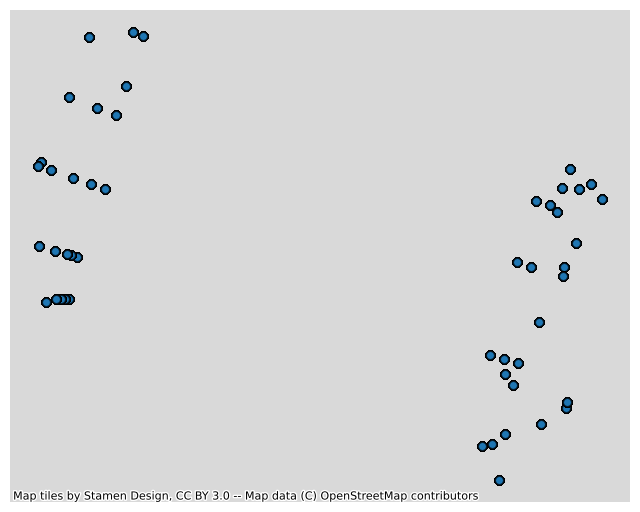

In [801]:
import contextily as ctx

ax = gdf['geom'].plot(figsize=(8, 12), alpha=0.5, edgecolor='k')
ctx.add_basemap(ax, zoom=12, source=ctx.providers.Stamen.TonerLite)
ax.set_axis_off()

In [802]:
import seaborn as sns

In [803]:
df_graph = df[['sensor', 'unidade', 'direcao_saida', 'latitude', 'longitude', 'estado', 'id_estado']].drop_duplicates()

In [804]:
df_graph

,sensor,unidade,direcao_saida,latitude,longitude,estado,id_estado
325,MV-BM-BV-31,l/min,Vazão,-3.146391,-51.790752,normal,3
787,MV-BM-BV-31,l/s,Vazão,-3.146391,-51.790752,normal,3
1249,MV-BM-BV-31,m3/s,Vazão,-3.146391,-51.790752,normal,3
1711,MV-BM-BV-51,l/min,Vazão,-3.150320,-51.790622,normal,3
2171,MV-BM-BV-51,l/s,Vazão,-3.150320,-51.790622,normal,3
...,...,...,...,...,...,...,...
43528,PZ-D06C-26,m.c.a,Carga Piezométrica,-3.147434,-51.774965,normal,3
43791,PZ-D06C-27,m,Cota Piezométrica,-3.153753,-51.776665,normal,3
44052,PZ-D06C-27,m.c.a,Carga Piezométrica,-3.153753,-51.776665,normal,3
44313,PZ-D06C-28,m,Cota Piezométrica,-3.147005,-51.775266,normal,3


In [805]:
df['size'] = df['id_estado'].apply(lambda x: 20 if x == 3 else ( 50 if x == 2 else 100))

In [806]:
leituras['direcao_saida'].value_counts()

direcao_saida
Cota Piezométrica                             19200
Carga Piezométrica                            19200
Vazão                                         10554
Cota do NA                                     6206
Recalque (Z)                                   1007
Deslocamento Longitudinal (X)                  1007
Deslocamento Transversal (Y)                   1007
Recalque                                        819
Deslocamento da Estaca Dir(-)/Esq(+)            819
Deslocamento do Afastamento Mont(-)/Jus(+)      819
Leitura                                          32
Name: count, dtype: int64

In [807]:
df_graph = df[['sensor', 'unidade', 'direcao_saida', 'estado', 'latitude', 'longitude', 'size']]

In [808]:
import plotly.express as px
fig = px.scatter(df_graph, x="latitude", y="longitude", color="estado", size='size', hover_data=['size'], symbol="estado")
fig.show()

In [809]:
#gdf.to_file('shape.geojson')

In [810]:
df[['unidade', 'direcao_saida']].value_counts()

unidade  direcao_saida     
m        Cota Piezométrica     17890
m.c.a    Carga Piezométrica    17890
l/min    Vazão                  2783
l/s      Vazão                  2783
m3/s     Vazão                  2783
Name: count, dtype: int64

In [811]:
#Todos os sensores, em diferentes escalas
fig = px.line(df, x="data", y="valor", color='sensor')
fig.show()

In [812]:
aux = df[df['unidade'] == 'm']
aux = aux[aux['direcao_saida'] == 'Cota do NA']
df = df.drop(index=aux.index)

In [813]:
df[df['direcao_saida'] == 'Vazão']['unidade'].value_counts()

unidade
l/min    2783
l/s      2783
m3/s     2783
Name: count, dtype: int64

In [814]:
df[['unidade', 'direcao_saida']].value_counts()

unidade  direcao_saida     
m        Cota Piezométrica     17890
m.c.a    Carga Piezométrica    17890
l/min    Vazão                  2783
l/s      Vazão                  2783
m3/s     Vazão                  2783
Name: count, dtype: int64

In [815]:
#craiação das categorias de dataframe

In [816]:
df_m_cota_piezometrica = df[df['direcao_saida'] == 'Cota Piezométrica']
df_m_cota_piezometrica = df_m_cota_piezometrica[df_m_cota_piezometrica['unidade'] == 'm']

print(f'df_m_cota_piezometrica {df_m_cota_piezometrica.shape}')

fig = px.line(df_m_cota_piezometrica, x="data", y="valor", color='sensor')
fig.show()

df_m_cota_piezometrica (17890, 18)


In [817]:
X = df_m_cota_piezometrica[['id_unidade', 'id_direcao_saida', 'id_area', 'month', 'latitude', 'longitude', 'altura', 'valor']]

In [818]:
from sklearn.ensemble import IsolationForest
Iforest = IsolationForest(max_samples=100, 
                          random_state=1111,
                         contamination=0.05,
                         max_features=1.0,
                         n_estimators=100,
                         verbose=1,
                         n_jobs=-1)
Iforest.fit(X)

[Parallel(n_jobs=12)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=12)]: Done   2 out of  12 | elapsed:    0.4s remaining:    2.5s
[Parallel(n_jobs=12)]: Done  12 out of  12 | elapsed:    0.6s finished


IsolationForest(contamination=0.05, max_samples=100, n_jobs=-1,
                random_state=1111, verbose=1)

In [819]:
df_m_cota_piezometrica = df[df['direcao_saida'] == 'Cota Piezométrica']
df_m_cota_piezometrica = df_m_cota_piezometrica[df_m_cota_piezometrica['unidade'] == 'm']

print(f'df_m_cota_piezometrica {df_m_cota_piezometrica.shape}')

#fig = px.line(df_m_cota_piezometrica, x="data", y="valor", color='sensor')
#fig.show()

df_m_cota_piezometrica (17890, 18)


In [820]:
y_pred = Iforest.predict(X)
df_m_cota_piezometrica['y_pred'] = y_pred

In [821]:
import plotly.graph_objects as go
fig = go.Figure()

fig.add_trace(go.Scatter(x=df_m_cota_piezometrica[df_m_cota_piezometrica['y_pred']==1]['data'].values, y=df_m_cota_piezometrica[df_m_cota_piezometrica['y_pred']==1]['valor'].values, mode='markers', name='Não Anomalia'))

fig.add_trace(go.Scatter(x=df_m_cota_piezometrica[df_m_cota_piezometrica['y_pred']==-1]['data'].values, y=df_m_cota_piezometrica[df_m_cota_piezometrica['y_pred']==-1]['valor'].values,
                    mode='markers',
                    name='Anomalia', ))

fig.show()

In [822]:
df_mca_carga_piezometrica = df[df['direcao_saida'] == 'Carga Piezométrica']
df_mca_carga_piezometrica = df_mca_carga_piezometrica[df_mca_carga_piezometrica['unidade'] == 'm.c.a']

print(f'df_mca_carga_piezométrica {df_mca_carga_piezometrica.shape}')

fig = px.line(df_mca_carga_piezometrica, x="data", y="valor", color='sensor')
fig.show()

df_mca_carga_piezométrica (17890, 18)


In [823]:
df_lmin_vazao = df[df['direcao_saida'] == 'Vazão']
df_lmin_vazao = df_lmin_vazao[df_lmin_vazao['unidade'] == 'l/min']

print(f'df_lmin_vazao {df_lmin_vazao.shape}')

fig = px.line(df_lmin_vazao, x="data", y="valor", color='sensor')
fig.show()

df_lmin_vazao (2783, 18)


In [824]:
df_m3s_vazao = df[df['direcao_saida'] == 'Vazão']
df_m3s_vazao = df_m3s_vazao[df_m3s_vazao['unidade'] == 'm3/s']

print(f'df_m3s_vazao {df_m3s_vazao.shape}')

fig = px.line(df_m3s_vazao, x="data", y="valor", color='sensor')
fig.show()

df_m3s_vazao (2783, 18)


In [825]:
df_ls_vazao = df[df['direcao_saida'] == 'Vazão']
df_ls_vazao = df_ls_vazao[df_ls_vazao['unidade'] == 'l/s']

print(f'df_ls_vazao {df_ls_vazao.shape}')

fig = px.line(df_ls_vazao, x="data", y="valor", color='sensor')
fig.show()

df_ls_vazao (2783, 18)


In [826]:
# sensores com alertas

query = '''
select *
from leituras l2
where sensor in (select sensor from leituras l where estado in ('alerta', 'atencao') group by sensor order by sensor desc)'''

atencao_alerta = pd.read_sql(query, con=con)

In [827]:
aux = leituras[leituras['sensor'] == 'PZ-BM-BV-52']

In [828]:
atencao_alerta.head()

,id_sensor,id_unidade,id_direcao_saida,id_estado,id_area,sensor,data,valor,unidade,direcao_saida,estado,area
0,194,4,1,3,1,PZ-BM-BV-52,2014-06-05 10:15:00,0.14,m.c.a,Carga Piezométrica,normal,Dique 6C
1,194,3,2,3,1,PZ-BM-BV-52,2014-06-05 10:15:00,29.94,m,Cota Piezométrica,normal,Dique 6C
2,194,4,1,3,1,PZ-BM-BV-52,2014-06-06 09:00:00,0.82,m.c.a,Carga Piezométrica,normal,Dique 6C
3,194,3,2,3,1,PZ-BM-BV-52,2014-06-06 09:00:00,30.62,m,Cota Piezométrica,normal,Dique 6C
4,194,3,2,3,1,PZ-BM-BV-52,2014-06-09 09:35:00,30.68,m,Cota Piezométrica,normal,Dique 6C


In [829]:
import plotly.graph_objects as go
fig = go.Figure()

aux = df[df['sensor'] == 'PZ-D06C-05']

fig.add_trace(go.Scatter(x=aux[aux['estado'] == 'normal']['data'].values, y=aux[aux['estado'] == 'normal']['valor'].values,
                    mode='markers',
                    name='normal', ))
fig.add_trace(go.Scatter(x=aux[aux['estado'] == 'atencao']['data'].values, y=aux[aux['estado'] == 'atencao']['valor'].values,
                    mode='markers',
                    name='Atencao', ))
fig.add_trace(go.Scatter(x=aux[aux['estado'] == 'alerta']['data'].values, y=aux[aux['estado'] == 'alerta']['valor'].values,
                    mode='markers',
                    name='Alerta', ))
fig.show()

In [830]:
import plotly.graph_objects as go
fig = go.Figure()

aux = df[df['sensor'] == 'PZ-BM-BV-52']

fig.add_trace(go.Scatter(x=aux[aux['estado'] == 'normal']['data'].values, y=aux[aux['estado'] == 'normal']['valor'].values,
                    mode='markers',
                    name='Normal', ))
fig.add_trace(go.Scatter(x=aux[aux['estado'] == 'atencao']['data'].values, y=aux[aux['estado'] == 'atencao']['valor'].values,
                    mode='markers',
                    name='Atencao', ))
fig.add_trace(go.Scatter(x=aux[aux['estado'] == 'alerta']['data'].values, y=aux[aux['estado'] == 'alerta']['valor'].values,
                    mode='markers',
                    name='Alerta', ))
fig.show()

In [831]:
asdsdavds

NameError: name 'asdsdavds' is not defined

In [ ]:
#X = df[df['sensor'] == 'PZ-BM-BV-52'][['id_sensor', 'id_unidade', 'id_direcao_saida', 'id_area', 'id_estado', 'month', 'latitude', 'longitude', 'altura']]
X = aux[['id_unidade', 'id_direcao_saida', 'id_area', 'month', 'latitude', 'longitude', 'altura', 'valor']]
X2 = aux[['id_sensor', 'id_unidade', 'id_direcao_saida', 'id_area', 'id_estado', 'month', 'data', 'latitude', 'longitude', 'altura', 'valor', 'sensor', 'estado']]

In [ ]:
from sklearn.ensemble import IsolationForest
Iforest = IsolationForest(max_samples=100, 
                          random_state=1111,
                         contamination=0.05,
                         max_features=1.0,
                         n_estimators=100,
                         verbose=1,
                         n_jobs=-1)
Iforest.fit(X)

[Parallel(n_jobs=12)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=12)]: Done   2 out of  12 | elapsed:    0.1s remaining:    0.9s
[Parallel(n_jobs=12)]: Done  12 out of  12 | elapsed:    0.1s finished


IsolationForest(contamination=0.05, max_samples=100, n_jobs=-1,
                random_state=1111, verbose=1)

In [ ]:
y_pred = Iforest.predict(X)
X2['y_pred'] = y_pred

C:\Users\Anselmo\AppData\Local\Temp\ipykernel_8976\3529446864.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [ ]:
import plotly.graph_objects as go
fig = go.Figure()

fig.add_trace(go.Scatter(x=X2[X2['y_pred']==1]['data'].values, y=X2[X2['y_pred']==1]['valor'].values,
                    mode='markers',
                    name='Não Anomalia', ))

fig.add_trace(go.Scatter(x=X2[X2['y_pred']==-1]['data'].values, y=X2[X2['y_pred']==-1]['valor'].values,
                    mode='markers',
                    name='Anomalia', ))

fig.show()